In [17]:
import numpy as np
import scipy as sci
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm_notebook

# Experimenting with 2D rotation matrix

In [32]:
theta = np.radians(30)

c, s = np.cos(theta), np.sin(theta)

R = np.array(((c, -s), (s, c)))

R

array([[ 0.8660254, -0.5      ],
       [ 0.5      ,  0.8660254]])

In [6]:
test_image = np.array(Image.open('/Users/crura/Desktop/Research/Magnetic_Field/eclipse2017_mhd_final/Central_Cross_Section_B_phi.png'))

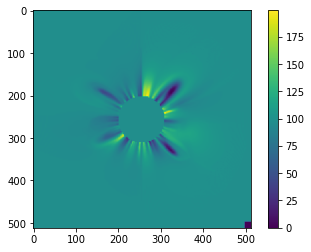

In [8]:
plt.imshow(test_image)
plt.colorbar()

In [10]:
test_image.shape

(512, 512)

In [53]:
theta = np.radians(360)

c, s = np.cos(theta), np.sin(theta)

R = np.array(((c, -s), (s, c)))

test_image_new = np.zeros(test_image.shape)
for i in tqdm_notebook(range(test_image.shape[0])):
    for j in range(test_image.shape[1]):
        try:
            inew,jnew = round(np.matmul(R,(i,j))[0]), round(np.matmul(R,(i,j))[1])
            test_image_new[inew][jnew] = test_image[i][j] 
        except IndexError:
            pass

<ipython-input-53-512e2b40324f>:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(test_image.shape[0])):


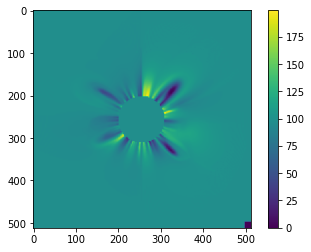

In [54]:
plt.imshow(test_image_new)
plt.colorbar()

In [36]:
i,j = 0,1
inew,jnew = np.matmul(R,(i,j))[0], np.matmul(R,(i,j))[1]
round(inew),round(jnew), test_image.shape

(0, 1, (512, 512))

In [ ]:

import numpy as np
from PIL import Image
import math


image = np.array(Image.open("test.png"))             # Load the image
angle=int(input("Enter the angle :- "))                # Ask the user to enter the angle of rotation

# Define the most occuring variables
angle=math.radians(angle)                               #converting degrees to radians
cosine=math.cos(angle)
sine=math.sin(angle)
height=image.shape[0]                                   #define the height of the image
width=image.shape[1]                                    #define the width of the image

# Define the height and width of the new image that is to be formed
new_height  = round(abs(image.shape[0]*cosine)+abs(image.shape[1]*sine))+1
new_width  = round(abs(image.shape[1]*cosine)+abs(image.shape[0]*sine))+1

# define another image variable of dimensions of new_height and new _column filled with zeros
output=np.zeros((new_height,new_width,image.shape[2]))

# Find the centre of the image about which we have to rotate the image
original_centre_height   = round(((image.shape[0]+1)/2)-1)    #with respect to the original image
original_centre_width    = round(((image.shape[1]+1)/2)-1)    #with respect to the original image

# Find the centre of the new image that will be obtained
new_centre_height= round(((new_height+1)/2)-1)        #with respect to the new image
new_centre_width= round(((new_width+1)/2)-1)          #with respect to the new image

for i in range(height):
    for j in range(width):
        #co-ordinates of pixel with respect to the centre of original image
        y=image.shape[0]-1-i-original_centre_height                   
        x=image.shape[1]-1-j-original_centre_width                      

        #co-ordinate of pixel with respect to the rotated image
        new_y=round(-x*sine+y*cosine)
        new_x=round(x*cosine+y*sine)

        '''since image will be rotated the centre will change too, 
           so to adust to that we will need to change new_x and new_y with respect to the new centre'''
        new_y=new_centre_height-new_y
        new_x=new_centre_width-new_x

        # adding if check to prevent any errors in the processing
        if 0 <= new_x < new_width and 0 <= new_y < new_height and new_x>=0 and new_y>=0:
            output[new_y,new_x,:]=image[i,j,:]                          #writing the pixels to the new destination in the output image

pil_img=Image.fromarray((output).astype(np.uint8))                       # converting array to image
pil_img.save("rotated_image.png")

# Now experimenting with 3D analysis

In [56]:
b_path = '/Users/crura/Desktop/Research/Magnetic_Field/eclipse2017_mhd_final/AnglesData_B_only.sav'

from scipy.io import readsav

sav_data = readsav(b_path)

In [63]:
br = sav_data['br']
bp = sav_data['bp']
bt = sav_data['bt']

In [64]:
br.shape, bp.shape, bt.shape

((698, 314, 294), (698, 314, 294), (698, 314, 294))

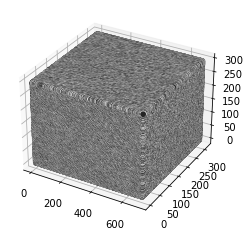

In [66]:
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt

# Make this bigger to generate a dense grid.
N = 8

# Create some random data.
volume = np.random.rand(698, 314, 294)

# Create the x, y, and z coordinate arrays.  We use 
# numpy's broadcasting to do all the hard work for us.
# We could shorten this even more by using np.meshgrid.
x = np.arange(volume.shape[0])[:, None, None]
y = np.arange(volume.shape[1])[None, :, None]
z = np.arange(volume.shape[2])[None, None, :]
x, y, z = np.broadcast_arrays(x, y, z)

# Turn the volumetric data into an RGB array that's
# just grayscale.  There might be better ways to make
# ax.scatter happy.
c = np.tile(volume.ravel()[:, None], [1, 3])

# Do the plotting in a single call.
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.scatter(x.ravel(),
           y.ravel(),
           z.ravel(),
           c=c)
plt.show()

ValueError: 'c' argument has 1 elements, which is inconsistent with 'x' and 'y' with size 64436568.

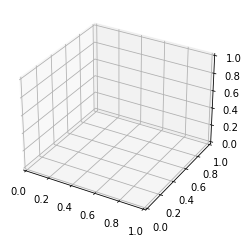

In [112]:
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.scatter(x.ravel(),
           y.ravel(),
           z.ravel(),
           c=c)
plt.show()

ValueError: shape mismatch: objects cannot be broadcast to a single shape

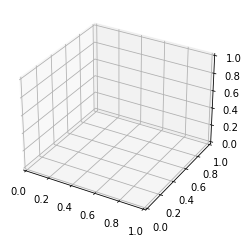

In [127]:
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt

# Make this bigger to generate a dense grid.
N = 8

# Create some random data.
volume = np.random.rand(698, int(314/2), 294)

# Create the x, y, and z coordinate arrays.  We use 
# numpy's broadcasting to do all the hard work for us.
# We could shorten this even more by using np.meshgrid.
x = np.arange(br.shape[0])[:, None, None]
y = np.arange(br.shape[1])[None, :, None]
z = np.arange(br.shape[2])[None, None, :]
x, y, z = np.broadcast_arrays(x, y, z)

# Turn the volumetric data into an RGB array that's
# just grayscale.  There might be better ways to make
# ax.scatter happy.
c = np.tile(br.ravel()[:, None], [1, 3])

# Do the plotting in a single call.
fig = plt.figure()
ax = fig.gca(projection='3d')
p = ax.scatter(br[:,0,0],
           br[0,:,0],
           br[0,0,:],
           cmap='viridis')
fig.colorbar(p)
#plt.colorbar()
plt.show()

In [77]:
br[:,None,None].shape

(698, 1, 1, 314, 294)

In [79]:
np.arange(volume.shape[0])[:, None, None]

array([[[  0]],

       [[  1]],

       [[  2]],

       [[  3]],

       [[  4]],

       [[  5]],

       [[  6]],

       [[  7]],

       [[  8]],

       [[  9]],

       [[ 10]],

       [[ 11]],

       [[ 12]],

       [[ 13]],

       [[ 14]],

       [[ 15]],

       [[ 16]],

       [[ 17]],

       [[ 18]],

       [[ 19]],

       [[ 20]],

       [[ 21]],

       [[ 22]],

       [[ 23]],

       [[ 24]],

       [[ 25]],

       [[ 26]],

       [[ 27]],

       [[ 28]],

       [[ 29]],

       [[ 30]],

       [[ 31]],

       [[ 32]],

       [[ 33]],

       [[ 34]],

       [[ 35]],

       [[ 36]],

       [[ 37]],

       [[ 38]],

       [[ 39]],

       [[ 40]],

       [[ 41]],

       [[ 42]],

       [[ 43]],

       [[ 44]],

       [[ 45]],

       [[ 46]],

       [[ 47]],

       [[ 48]],

       [[ 49]],

       [[ 50]],

       [[ 51]],

       [[ 52]],

       [[ 53]],

       [[ 54]],

       [[ 55]],

       [[ 56]],

       [[ 57]],

       [[ 58]]

In [86]:
np.tile(br.ravel()[:, None], [1, 3]).shape

(64436568, 3)

# Now experimenting with rotating a 3d object about an angle

In [101]:
R3 = np.array(((c, -s,c), (s, c,c)(c,c,c)))

<>:1: SyntaxWarning: 'tuple' object is not callable; perhaps you missed a comma?
<>:1: SyntaxWarning: 'tuple' object is not callable; perhaps you missed a comma?
<ipython-input-101-0b6bce564e7a>:1: SyntaxWarning: 'tuple' object is not callable; perhaps you missed a comma?
  R3 = np.array(((c, -s,c), (s, c,c)(c,c,c)), dtype='object')


TypeError: 'tuple' object is not callable

In [100]:
np.array(((1, 0,0), (0, c,-s),(0, s,c)))[0,0]

<ipython-input-100-11f33cc874d2>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array(((1, 0,0), (0, c,-s),(0, s,c)))[0,0]


1

In [131]:
theta = np.radians(60)
c = np.cos(theta)
s - np.sin(theta)
# Define x rotation matrix
R3x = np.zeros((3,3))
R3x[0] = [1,0,0]
R3x[1] = [0,c,-s]
R3x[2] = [0,s,c]
#R3x

R3y = np.zeros((3,3))
R3y[0] = [c,0,s]
R3y[1] = [0,1,0]
R3y[2] = [-s,0,c]
#R3y

R3z = np.zeros((3,3))
R3z[0] = [c,-s,0]
R3z[1] = [s,c,0]
R3z[2] = [0,0,1]
print(R3x)
print(R3y)
print(R3z)

[[ 1.0000000e+00  0.0000000e+00  0.0000000e+00]
 [ 0.0000000e+00  5.0000000e-01  2.4492936e-16]
 [ 0.0000000e+00 -2.4492936e-16  5.0000000e-01]]
[[ 5.0000000e-01  0.0000000e+00 -2.4492936e-16]
 [ 0.0000000e+00  1.0000000e+00  0.0000000e+00]
 [ 2.4492936e-16  0.0000000e+00  5.0000000e-01]]
[[ 5.0000000e-01  2.4492936e-16  0.0000000e+00]
 [-2.4492936e-16  5.0000000e-01  0.0000000e+00]
 [ 0.0000000e+00  0.0000000e+00  1.0000000e+00]]


In [106]:
c

array([[ 4.35982114e+00,  4.35982114e+00,  4.35982114e+00],
       [ 4.37642702e+00,  4.37642702e+00,  4.37642702e+00],
       [ 4.39198164e+00,  4.39198164e+00,  4.39198164e+00],
       ...,
       [-4.65984295e-03, -4.65984295e-03, -4.65984295e-03],
       [-4.40221076e-03, -4.40221076e-03, -4.40221076e-03],
       [-4.16183984e-03, -4.16183984e-03, -4.16183984e-03]])

In [109]:
np.arange(br.shape[1])[None, :, None]

array([[[  0],
        [  1],
        [  2],
        [  3],
        [  4],
        [  5],
        [  6],
        [  7],
        [  8],
        [  9],
        [ 10],
        [ 11],
        [ 12],
        [ 13],
        [ 14],
        [ 15],
        [ 16],
        [ 17],
        [ 18],
        [ 19],
        [ 20],
        [ 21],
        [ 22],
        [ 23],
        [ 24],
        [ 25],
        [ 26],
        [ 27],
        [ 28],
        [ 29],
        [ 30],
        [ 31],
        [ 32],
        [ 33],
        [ 34],
        [ 35],
        [ 36],
        [ 37],
        [ 38],
        [ 39],
        [ 40],
        [ 41],
        [ 42],
        [ 43],
        [ 44],
        [ 45],
        [ 46],
        [ 47],
        [ 48],
        [ 49],
        [ 50],
        [ 51],
        [ 52],
        [ 53],
        [ 54],
        [ 55],
        [ 56],
        [ 57],
        [ 58],
        [ 59],
        [ 60],
        [ 61],
        [ 62],
        [ 63],
        [ 64],
        [ 65],
        [ 

In [111]:
x.shape

(698, 314, 294)

In [126]:
br[:,0,0].shape

(698,)

In [124]:
R3x[3]

IndexError: index 3 is out of bounds for axis 0 with size 3

In [128]:
np.broadcast_arrays(br[:,0,0], br[0,:,0], br[0,0,:])

ValueError: shape mismatch: objects cannot be broadcast to a single shape

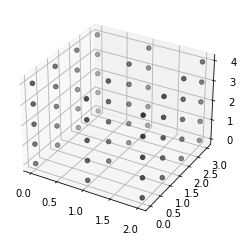

In [137]:
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt

# Make this bigger to generate a dense grid.
N = 8

# Create some random data.
volume = np.zeros((3, 4, 5))

for i in range(volume.shape[0]):
    for j in range(volume.shape[1]):
        for k in range(volume.shape[2]):
            volume[i][j][k] = 0.21

# Create the x, y, and z coordinate arrays.  We use 
# numpy's broadcasting to do all the hard work for us.
# We could shorten this even more by using np.meshgrid.
x = np.arange(volume.shape[0])[:, None, None]
y = np.arange(volume.shape[1])[None, :, None]
z = np.arange(volume.shape[2])[None, None, :]
x, y, z = np.broadcast_arrays(x, y, z)

# Turn the volumetric data into an RGB array that's
# just grayscale.  There might be better ways to make
# ax.scatter happy.
c = np.tile(volume.ravel()[:, None], [1, 3])

# Do the plotting in a single call.
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.scatter(x.ravel(),
           y.ravel(),
           z.ravel(),
           c=c)
plt.show()

In [139]:
x.ravel()

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

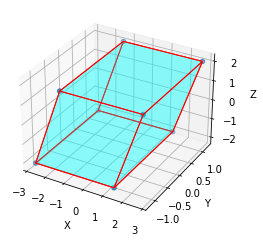

In [141]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection, Line3DCollection
import matplotlib.pyplot as plt

points = np.array([[-1, -1, -1],
                  [1, -1, -1 ],
                  [1, 1, -1],
                  [-1, 1, -1],
                  [-1, -1, 1],
                  [1, -1, 1 ],
                  [1, 1, 1],
                  [-1, 1, 1]])

P = [[2.06498904e-01 , -6.30755443e-07 ,  1.07477548e-03],
 [1.61535574e-06 ,  1.18897198e-01 ,  7.85307721e-06],
 [7.08353661e-02 ,  4.48415767e-06 ,  2.05395893e-01]]

Z = np.zeros((8,3))
for i in range(8): Z[i,:] = np.dot(points[i,:],P)
Z = 10.0*Z

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

r = [-1,1]

X, Y = np.meshgrid(r, r)
# plot vertices
ax.scatter3D(Z[:, 0], Z[:, 1], Z[:, 2])

# list of sides' polygons of figure
verts = [[Z[0],Z[1],Z[2],Z[3]],
 [Z[4],Z[5],Z[6],Z[7]], 
 [Z[0],Z[1],Z[5],Z[4]], 
 [Z[2],Z[3],Z[7],Z[6]], 
 [Z[1],Z[2],Z[6],Z[5]],
 [Z[4],Z[7],Z[3],Z[0]]]

# plot sides
ax.add_collection3d(Poly3DCollection(verts, 
 facecolors='cyan', linewidths=1, edgecolors='r', alpha=.25))

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

In [144]:
Z.shape

(8, 3)

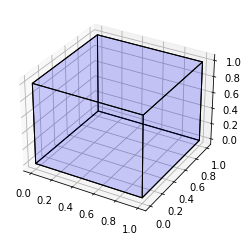

In [197]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection, Line3DCollection

def plot_cube(cube_definition):
    cube_definition_array = [
        np.array(list(item))
        for item in cube_definition
    ]

    points = []
    points += cube_definition_array
    vectors = [
        cube_definition_array[1] - cube_definition_array[0],
        cube_definition_array[2] - cube_definition_array[0],
        cube_definition_array[3] - cube_definition_array[0]
    ]

    points += [cube_definition_array[0] + vectors[0] + vectors[1]]
    points += [cube_definition_array[0] + vectors[0] + vectors[2]]
    points += [cube_definition_array[0] + vectors[1] + vectors[2]]
    points += [cube_definition_array[0] + vectors[0] + vectors[1] + vectors[2]]

    points = np.array(points)

    edges = [
        [points[0], points[3], points[5], points[1]],
        [points[1], points[5], points[7], points[4]],
        [points[4], points[2], points[6], points[7]],
        [points[2], points[6], points[3], points[0]],
        [points[0], points[2], points[4], points[1]],
        [points[3], points[6], points[7], points[5]]
    ]

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    faces = Poly3DCollection(edges, linewidths=1, edgecolors='k')
    faces.set_facecolor((0,0,1,0.1))

    ax.add_collection3d(faces)

    # Plot the points themselves to force the scaling of the axes
    ax.scatter(points[:,0], points[:,1], points[:,2], s=0)

    ax.set_aspect('auto')


cube_definition = [
    (0,0,0), (0,1,0), (1,0,0), (0,0,1)
]
plot_cube(cube_definition)

In [156]:
len(cube_definition)

4

In [182]:
cube_definition = [
    (0,0,0), (0,1,0), (1,0,0), (0,0,1)
]

cornerlist = []
rot_cube_def = np.zeros((4,3))
for i in range(0,len(cube_definition)):
    corner = np.array(cube_definition[i])
    
    rotated_corner = np.matmul(R3x,corner)
    rot_cube_def[i][0] = rotated_corner[0]
    rot_cube_def[i][1] = rotated_corner[1]
    rot_cube_def[i][2] = rotated_corner[2]
    
    cornerlist.append((rotated_corner[0],rotated_corner[1],rotated_corner[2]))
rotated_corner

array([0.0000000e+00, 2.4492936e-16, 5.0000000e-01])

In [163]:
rotated_corner[0]

0.0

In [166]:
cube_definition[i][0] = rotated_corner[0]

TypeError: 'tuple' object does not support item assignment

In [168]:
len(cube_definition)

4

In [173]:
rot_cube_def.tolist()


([[0.0, 0.0, 0.0],
  [0.0, 0.5000000000000001, -2.4492935982947064e-16],
  [1.0, 0.0, 0.0],
  [0.0, 2.4492935982947064e-16, 0.5000000000000001]],
 [(0, 0, 0), (0, 1, 0), (1, 0, 0), (0, 0, 1)])

In [181]:
cube_definition

[(0, 0, 0), (0, 1, 0), (1, 0, 0), (0, 0, 1)]

[0.0, 2.4492935982947064e-16, 0.5000000000000001]

In [183]:
cornerlist

[(0.0, 0.0, 0.0),
 (0.0, 0.5000000000000001, -2.4492935982947064e-16),
 (1.0, 0.0, 0.0),
 (0.0, 2.4492935982947064e-16, 0.5000000000000001)]

dimensions of original cube: 1.0, 0.5, 0.5, volume: 0.25
dimensions of rotated cube: 1.0, 0.5, 0.5, volume: 0.25


[(0.0, 0.0, 0.0),
 (-1.0, 6.123233995736766e-17, 0.0),
 (3.061616997868383e-17, 0.5, 0.0),
 (0.0, 0.0, 0.5)]

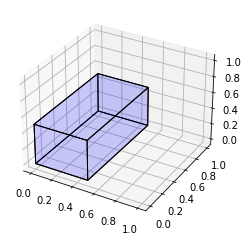

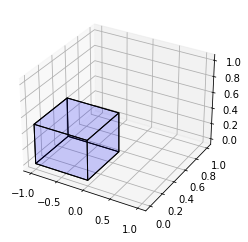

In [229]:
theta = np.radians(90)
c = np.cos(theta)
s = np.sin(theta)
# Define x rotation matrix
R3x = np.zeros((3,3))
R3x[0] = [1,0,0]
R3x[1] = [0,c,-s]
R3x[2] = [0,s,c]
#R3x
# Define y rotation matrix
R3y = np.zeros((3,3))
R3y[0] = [c,0,s]
R3y[1] = [0,1,0]
R3y[2] = [-s,0,c]
#R3y
# Define z rotation matrix
R3z = np.zeros((3,3))
R3z[0] = [c,-s,0]
R3z[1] = [s,c,0]
R3z[2] = [0,0,1]




cube_definition = [
    (0,0,0), (0,1,0), (0.5,0,0), (0,0,0.5)
]

cornerlist = []
rot_cube_def = np.zeros((4,3))
for i in range(0,len(cube_definition)):
    corner = np.array(cube_definition[i])
    
    rotated_corner = np.matmul(R3z,corner)
    rot_cube_def[i][0] = rotated_corner[0]
    rot_cube_def[i][1] = rotated_corner[1]
    rot_cube_def[i][2] = rotated_corner[2]
    
    cornerlist.append((rotated_corner[0],rotated_corner[1],rotated_corner[2]))

    
try:
    plot_cube(cube_definition)
except NotImplementedError:
    pass

try:
    plot_cube(cornerlist)
except NotImplementedError:
    pass


# check to see if volume is retained with transformation
length = np.sqrt((cube_definition[0][0] - cube_definition[1][0])**2 + (cube_definition[0][1] - cube_definition[1][1])**2 + (cube_definition[0][2] - cube_definition[1][2])**2)
width = np.sqrt((cube_definition[0][0] - cube_definition[2][0])**2 + (cube_definition[0][1] - cube_definition[2][1])**2 + (cube_definition[0][2] - cube_definition[2][2])**2)
height = np.sqrt((cube_definition[0][0] - cube_definition[3][0])**2 + (cube_definition[0][1] - cube_definition[3][1])**2 + (cube_definition[0][2] - cube_definition[3][2])**2)
vol_1 = length * width * height

length2 = np.sqrt((cornerlist[0][0] - cornerlist[1][0])**2 + (cornerlist[0][1] - cornerlist[1][1])**2 + (cornerlist[0][2] - cornerlist[1][2])**2)
width2 = np.sqrt((cornerlist[0][0] - cornerlist[2][0])**2 + (cornerlist[0][1] - cornerlist[2][1])**2 + (cornerlist[0][2] - cornerlist[2][2])**2)
height2 = np.sqrt((cornerlist[0][0] - cornerlist[3][0])**2 + (cornerlist[0][1] - cornerlist[3][1])**2 + (cornerlist[0][2] - cornerlist[3][2])**2)
vol_2 = length2 * width2 * height2

print('dimensions of original cube: {}, {}, {}, volume: {}'.format(length,width,height,vol_1))
print('dimensions of rotated cube: {}, {}, {}, volume: {}'.format(length2,width2,height2,vol_2))
cornerlist


In [199]:
# check to see if volume is retained with transformation

cube_definition, cornerlist

([(0, 0, 0), (0, 1, 0), (0.5, 0, 0), (0, 0, 0.5)],
 [(0.0, 0.0, 0.0),
  (0.0, -1.0, -2.4492935982947064e-16),
  (0.5, 0.0, 0.0),
  (0.0, 1.2246467991473532e-16, -0.5)])

In [209]:
length = np.sqrt((cube_definition[0][0] - cube_definition[1][0])**2 + (cube_definition[0][1] - cube_definition[1][1])**2 + (cube_definition[0][2] - cube_definition[1][2])**2)
width = np.sqrt((cube_definition[0][0] - cube_definition[2][0])**2 + (cube_definition[0][1] - cube_definition[2][1])**2 + (cube_definition[0][2] - cube_definition[2][2])**2)
height = np.sqrt((cube_definition[0][0] - cube_definition[3][0])**2 + (cube_definition[0][1] - cube_definition[3][1])**2 + (cube_definition[0][2] - cube_definition[3][2])**2)
vol_1 = length * width * height


length, width, height, vol_1

(1.0, 0.5, 0.5, 0.25)

In [210]:
length2 = np.sqrt((cornerlist[0][0] - cornerlist[1][0])**2 + (cornerlist[0][1] - cornerlist[1][1])**2 + (cornerlist[0][2] - cornerlist[1][2])**2)
width2 = np.sqrt((cornerlist[0][0] - cornerlist[2][0])**2 + (cornerlist[0][1] - cornerlist[2][1])**2 + (cornerlist[0][2] - cornerlist[2][2])**2)
height2 = np.sqrt((cornerlist[0][0] - cornerlist[3][0])**2 + (cornerlist[0][1] - cornerlist[3][1])**2 + (cornerlist[0][2] - cornerlist[3][2])**2)
vol_2 = length2 * width2 * height2
length2, width2, height2, vol_2

(1.0, 0.5, 0.5, 0.25)

In [227]:
np.matmul(R3x,corner), np.array(cube_definition[i])

(array([ 0.        , -0.30090751,  0.39931776]), array([0. , 0. , 0.5]))

In [222]:
corner

array([0. , 0. , 0.5])

In [8]:
import pandas as pd
dfB=pd.read_csv('/Users/crura/Downloads/b_x_central.csv', sep=',',header=None)
arr = dfB.values

In [4]:
dfB

,0.00000,0.00000.1,0.00000.2,0.00000.3,0.00000.4,0.00000.5,0.00000.6,0.00000.7,0.00000.8,0.00000.9,...,0.00000.73,0.00000.74,0.00000.75,0.00000.76,0.00000.77,0.00000.78,0.00000.79,0.00000.80,0.00000.81,0.00000.82
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
97,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
98,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
arr.reshape(101,101)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [10]:
arr.shape

(101, 101)

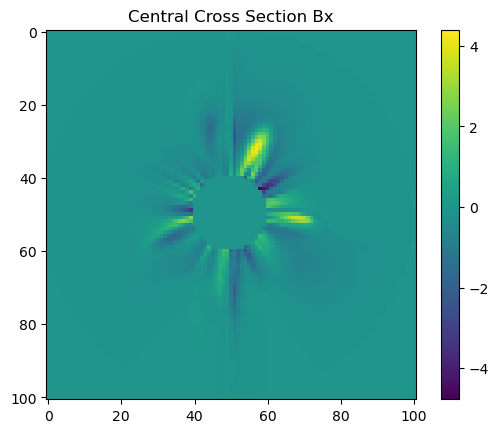

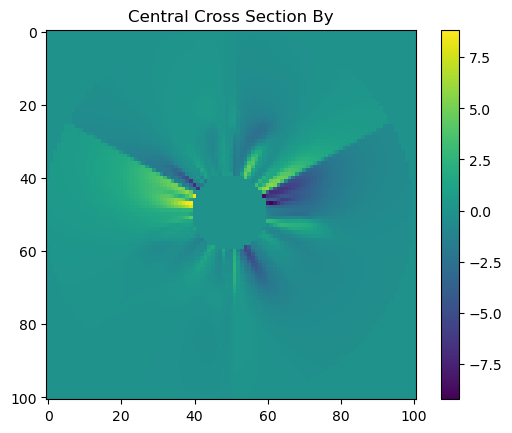

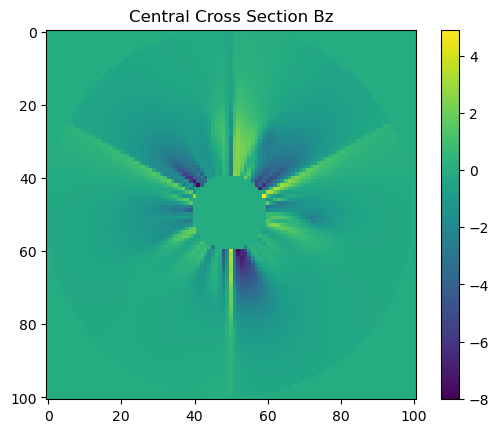

<ipython-input-12-ec68bfeb7f00>:37: RuntimeWarning: invalid value encountered in true_divide
  myMatrix = B_y / B_x


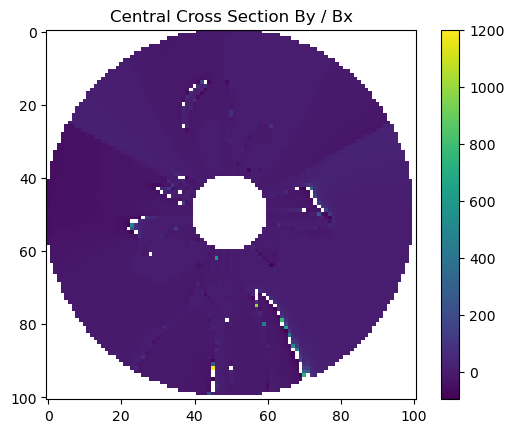

In [12]:
import numpy as np
import scipy as sci
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

dfBx=pd.read_csv('/Users/crura/Downloads/b_x_central.csv', sep=',',header=None)
B_x = dfBx.values

mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(B_x)
plt.colorbar()
plt.title('Central Cross Section Bx')
plt.show()

dfBy=pd.read_csv('/Users/crura/Downloads/b_y_central.csv', sep=',',header=None)
B_y = dfBy.values

mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(B_y)
plt.colorbar()
plt.title('Central Cross Section By')
plt.show()


dfBz=pd.read_csv('/Users/crura/Downloads/b_z_central.csv', sep=',',header=None)
B_z = dfBz.values

mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(B_z)
plt.colorbar()
plt.title('Central Cross Section Bz')
plt.show()

lowerBound = -10000000
upperBound = -100
myMatrix = B_y / B_x

myMatrix =np.ma.masked_where((lowerBound < myMatrix) & 
                             (myMatrix < upperBound), myMatrix)


mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(myMatrix)
plt.colorbar()
plt.title('Central Cross Section By / Bx')
plt.show()

In [24]:
np.meshgrid(B_x,B_y)

[array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])]

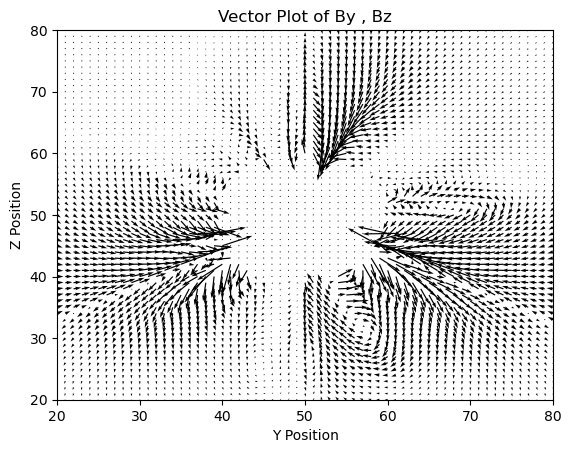

In [85]:
# define n x n grid with spacing dy, dz 
dy = np.linspace(0,100,101)
dz = np.linspace(0,100,101)
# make plot large
mpl.rcParams.update(mpl.rcParamsDefault)
plt.quiver(dy,dz,B_y,B_z) #Make B_x, B_y the x and y directions of each field vector
# zoom in plot
plt.xlim(20,80)
plt.ylim(20,80)
# make title
plt.title('Vector Plot of By , Bz')
plt.xlabel('Y Position')
plt.ylabel('Z Position')
# show the plot
plt.show()

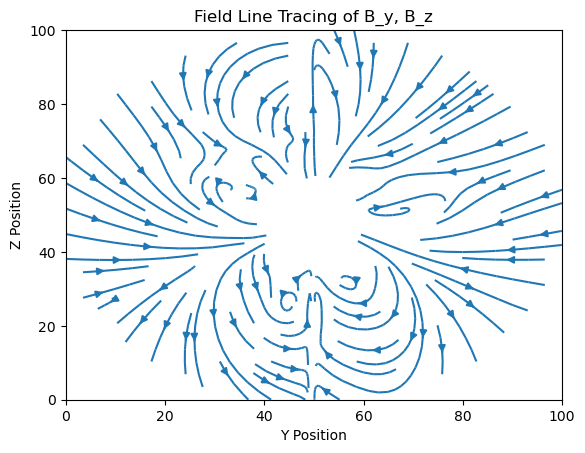

In [79]:
# define n x n grid with spacing dy, dz 
nx = np.linspace(0,100,101)
ny = np.linspace(0,100,101)
# define streamplot based on B_y , B_z vector field
plt.streamplot(nx,ny,B_y,B_z,density=1) 
plt.title('Field Line Tracing of B_y, B_z')
plt.xlabel('Y Position')
plt.ylabel('Z Position')
# show plot
plt.show()

In [34]:
np.linspace(0,100,101).shape

(101,)

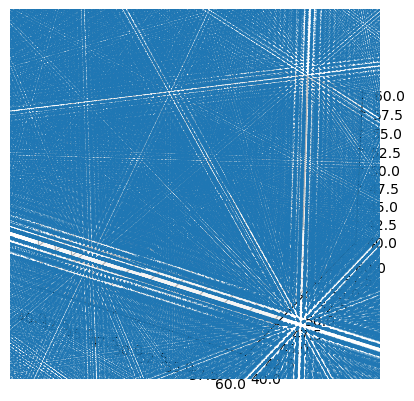

In [24]:
import matplotlib.pyplot as plt
import numpy as np

ax = plt.figure().add_subplot(projection='3d')

# Make the grid
nx,ny,nz = np.meshgrid(np.linspace(0,100,101),np.linspace(0,100,101),np.linspace(0,100,101))



ax.quiver(nx, ny, nz, B_x, B_y, B_z, length=0.1, normalize=True)
ax.set_xlim(40,60)
ax.set_ylim(40,60)
ax.set_zlim(40, 60)

plt.show()

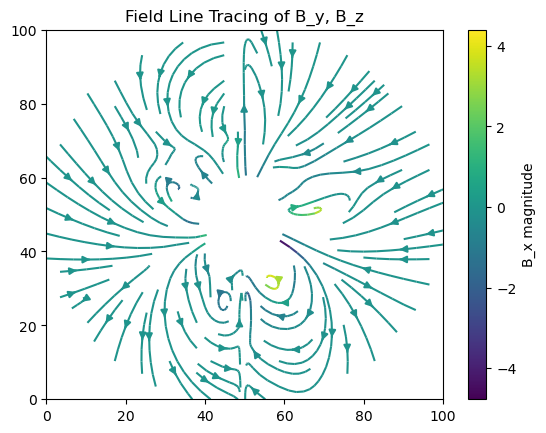

In [72]:
# define n x n grid with spacing dy, dz 
nx = np.linspace(0,100,101)
ny = np.linspace(0,100,101)
# define streamplot based on B_y , B_z vector field
plt.streamplot(nx,ny,B_y,B_z,color=B_x,density=1) # make color of each line represent magnitude of B_x
plt.title('Field Line Tracing of B_y, B_z')
plt.colorbar(label='B_x magnitude')
plt.show()

# New Conversion Attempt

In [4]:
import numpy as np
import scipy as sci
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

dfBx=pd.read_csv('/Users/crura/Desktop/Research/PSI_Coordinate_Conversion/bx.csv', sep=',',header=None)
dfBy=pd.read_csv('/Users/crura/Desktop/Research/PSI_Coordinate_Conversion/by.csv', sep=',',header=None)
dfBz=pd.read_csv('/Users/crura/Desktop/Research/PSI_Coordinate_Conversion/bz.csv', sep=',',header=None)
B_x = dfBx.values
B_y = dfBy.values
B_z = dfBz.values

Bx = B_x.reshape(294,314,698)
By = B_y.reshape(294,314,698)
Bz = B_z.reshape(294,314,698)



In [6]:
Bx.shape[0]

294

In [19]:
Bx_central = Bx[int(Bx.shape[0]/2),:,:]
By_central = By[int(By.shape[0]/2),:,:]

In [20]:
Bx_central.shape

(314, 698)

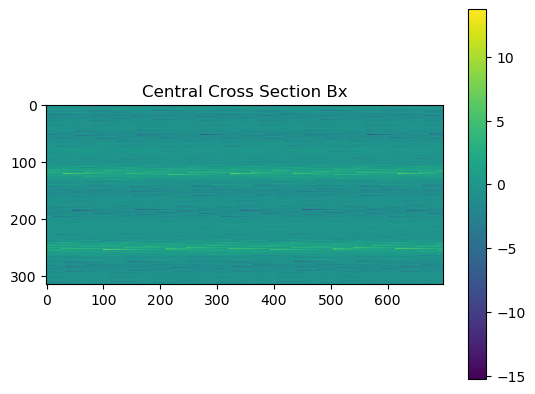

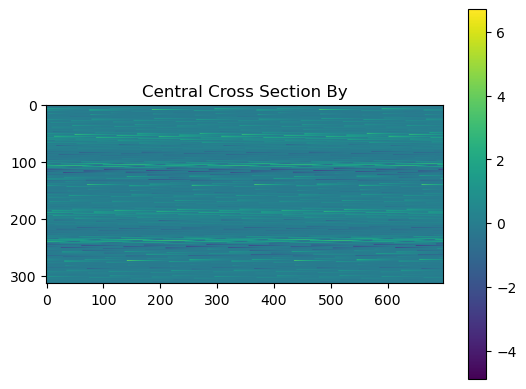

In [21]:
mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(Bx_central)
plt.colorbar()
plt.title('Central Cross Section Bx')
plt.show()


mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(By_central)
plt.colorbar()
plt.title('Central Cross Section By')
plt.show()



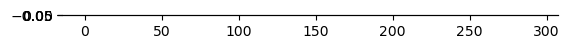

In [15]:
# define n x n grid with spacing dy, dz 
plt.quiver(Bx_central,By_central)
plt.show()

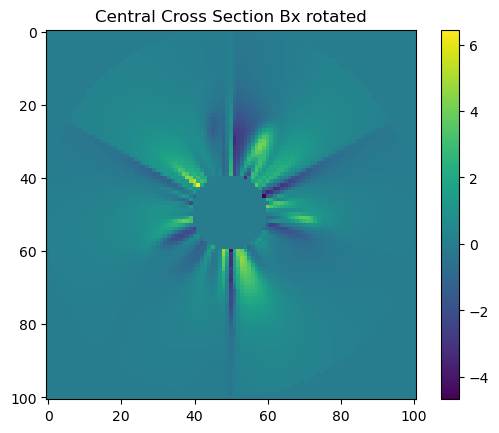

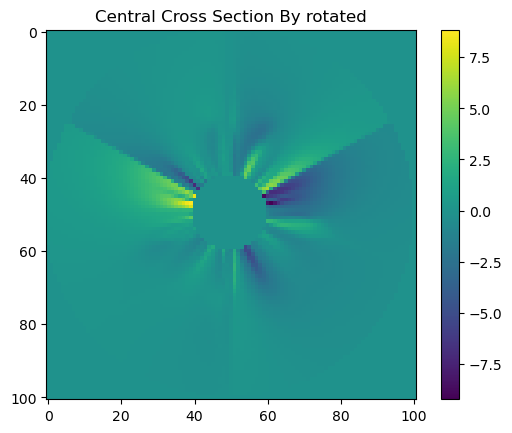

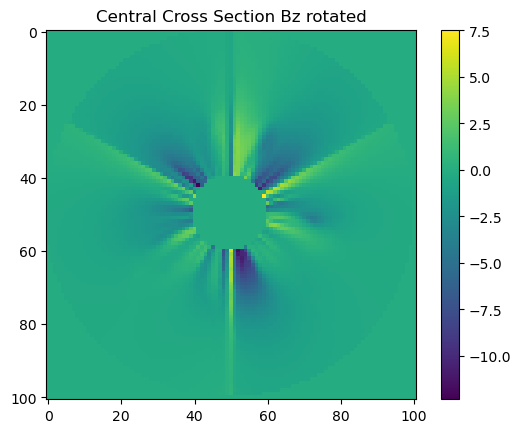

<ipython-input-33-658020812dbf>:37: RuntimeWarning: invalid value encountered in true_divide
  myMatrix = B_y / B_x


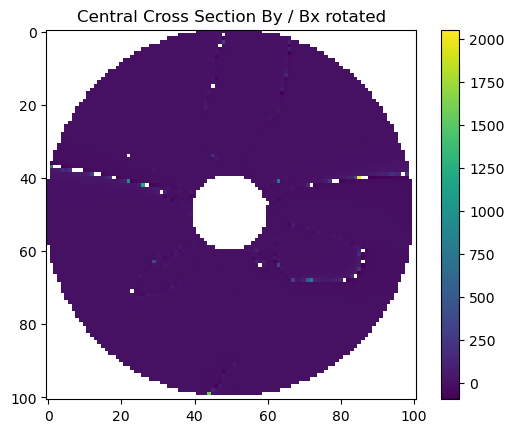

In [33]:
import numpy as np
import scipy as sci
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

dfBx=pd.read_csv('/Users/crura/Downloads/b_x_central_rotated.csv', sep=',',header=None)
B_x = dfBx.values

mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(B_x)
plt.colorbar()
plt.title('Central Cross Section Bx rotated')
plt.show()

dfBy=pd.read_csv('/Users/crura/Downloads/b_y_central_rotated.csv', sep=',',header=None)
B_y = dfBy.values

mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(B_y)
plt.colorbar()
plt.title('Central Cross Section By rotated')
plt.show()


dfBz=pd.read_csv('/Users/crura/Downloads/b_z_central_rotated.csv', sep=',',header=None)
B_z = dfBz.values

mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(B_z)
plt.colorbar()
plt.title('Central Cross Section Bz rotated')
plt.show()

lowerBound = -10000000
upperBound = -100
myMatrix = B_y / B_x

myMatrix =np.ma.masked_where((lowerBound < myMatrix) & 
                             (myMatrix < upperBound), myMatrix)


mpl.rcParams.update(mpl.rcParamsDefault)
plt.imshow(myMatrix)
plt.colorbar()
plt.title('Central Cross Section By / Bx rotated')
plt.show()

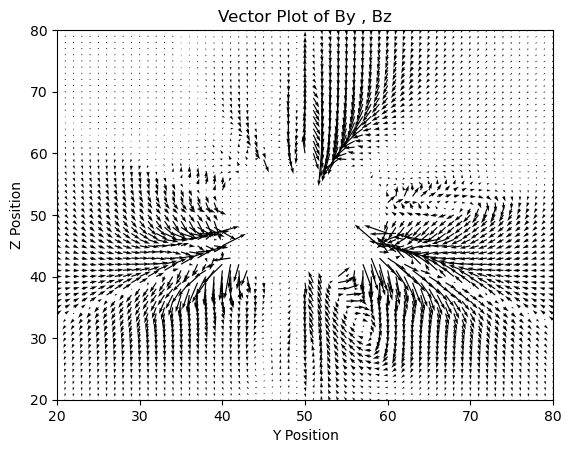

In [34]:
# define n x n grid with spacing dy, dz 
dy = np.linspace(0,100,101)
dz = np.linspace(0,100,101)
# make plot large
mpl.rcParams.update(mpl.rcParamsDefault)
plt.quiver(dy,dz,B_y,B_z) #Make B_x, B_y the x and y directions of each field vector
# zoom in plot
plt.xlim(20,80)
plt.ylim(20,80)
# make title
plt.title('Vector Plot of By , Bz')
plt.xlabel('Y Position')
plt.ylabel('Z Position')
# show the plot
plt.show()

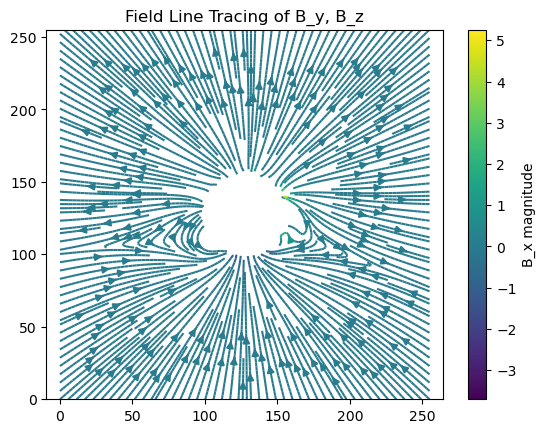

In [98]:
# define n x n grid with spacing dy, dz 
ny = np.linspace(0,255,256)
nz = np.linspace(0,255,256)
# define streamplot based on B_y , B_z vector field
plt.streamplot(ny,nz,arrBy,arrBz,color=arrBx,density=3) # make color of each line represent magnitude of B_x
plt.title('Field Line Tracing of B_y, B_z')
plt.colorbar(label='B_x magnitude')
plt.axis('equal')
# plt.xlim(50,200)
# plt.ylim(50,200)
plt.show()

In [47]:
#/Users/crura/DENSROTATED.csv
dens=pd.read_csv('/Users/crura/DENSROTATED.csv', sep=',',header=None)


densval = dens.values


In [4]:
densval.shape

(256, 256)

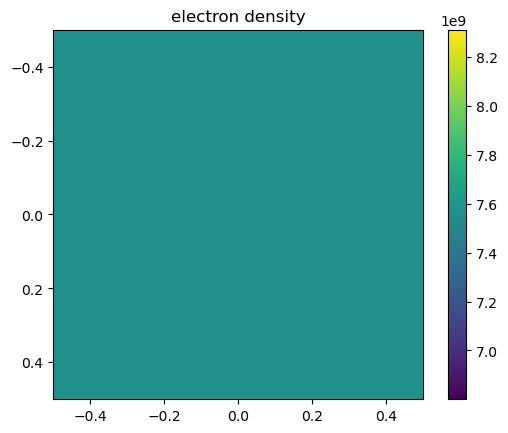

In [48]:
plt.imshow(densval)
plt.colorbar()
plt.title('electron density')
plt.show()

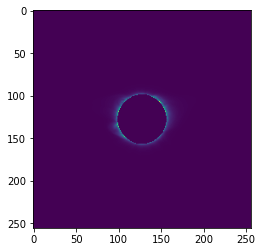

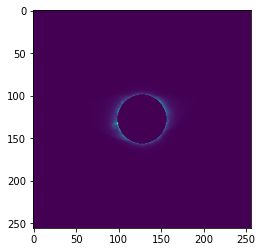

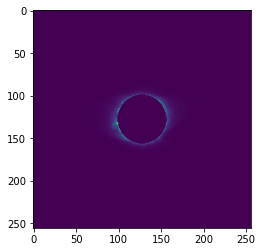

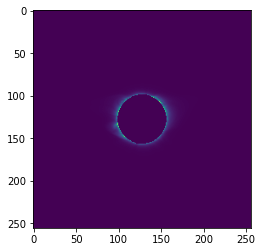

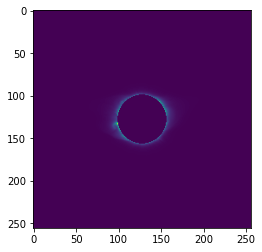

...

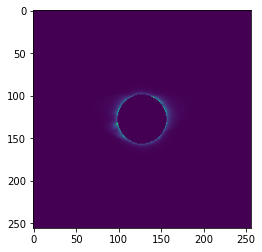

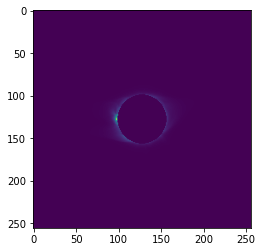

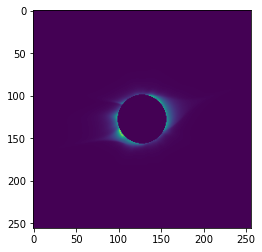

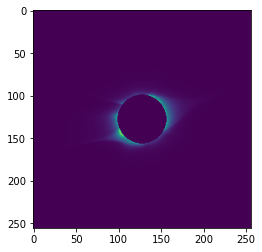

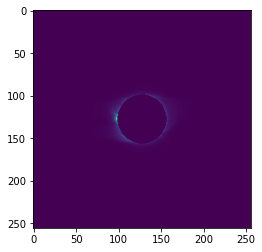

In [6]:
import os
from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np
import scipy as sci
import matplotlib
from tqdm import tqdm_notebook
import pandas as pd
import matplotlib as mpl

path = "/Users/crura/Desktop/Research/Magnetic_Field/Rotated_Density_LOS/"
parent_list = os.listdir("/Users/crura/Desktop/Research/Magnetic_Field/Rotated_Density_LOS")
imagelist = []
headlist = []
for child in parent_list:
    
    
    file = str(path + child)
    df_dens=pd.read_csv(file, sep=',',header=None)
    image_data = df_dens.values
    imagelist.append(image_data)
    plt.imshow(image_data)
    plt.show()
    plt.close()



In [198]:
imagelist

[array([[4425.33951699, 4470.57052996, 4516.26760433, ..., 4468.30151657,
         4435.04891553, 4402.05101441],
        [4469.84105285, 4516.321327  , 4565.37065572, ..., 4531.76851755,
         4494.76871455, 4460.27533434],
        [4514.48752236, 4564.46788263, 4614.05495339, ..., 4594.93936333,
         4557.359346  , 4518.79205396],
        ...,
        [4194.81684632, 4254.91984653, 4315.09058085, ..., 1989.35476857,
         1937.16749027, 1886.59501636],
        [4166.32244758, 4223.17357082, 4279.71318137, ..., 2005.36354344,
         1945.62167924, 1895.60453782],
        [4137.35269719, 4189.98290335, 4243.61210311, ..., 2020.16309937,
         1961.91091681, 1904.98470746]]),
 array([[4256.20123331, 4285.96074258, 4314.99255806, ..., 5586.63042303,
         5557.02787721, 5525.99102097],
        [4315.76066919, 4345.78295641, 4376.07839181, ..., 5674.29681389,
         5642.629374  , 5609.6762141 ],
        [4375.22951152, 4406.65622895, 4440.16964613, ..., 5765.50145164,

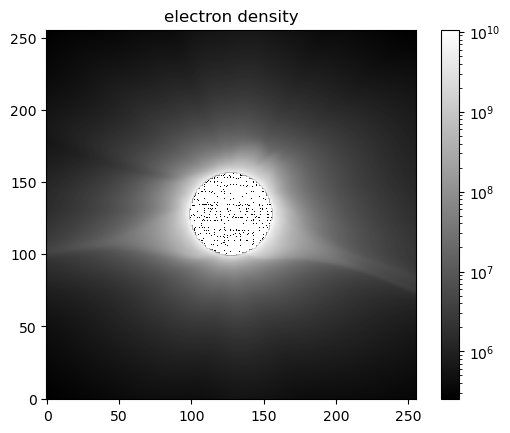

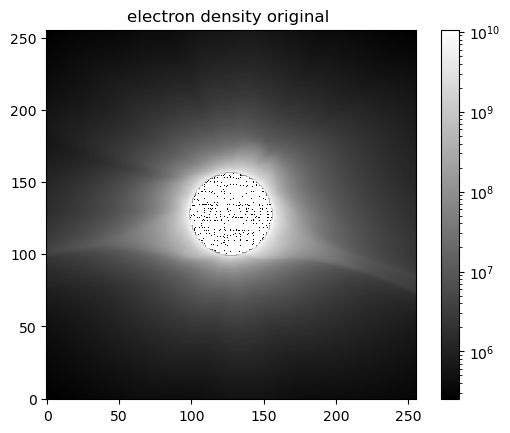

9.5367431640625e-07

In [7]:

# make plots large
mpl.rcParams.update(mpl.rcParamsDefault)


#imcombmean = np.mean(imagelist, axis=0)
imcombmean = np.sum(imagelist, axis=0)
np.savetxt("Integrated_Density_Test.csv", imcombmean.ravel(), delimiter=",")

plt.imshow(imcombmean,norm=matplotlib.colors.LogNorm(),cmap='gist_gray',origin='lower')
plt.colorbar()
plt.title('electron density')
plt.show()


# the google drive information is below
dfDens_Drive=pd.read_csv('/Users/crura/Desktop/Research/Papers/INTEGRATED_ELECTRON_DENSITY_2D.csv', sep=',',header=None)


arrDens_Drive = dfDens_Drive.values


plt.imshow(arrDens_Drive,norm=matplotlib.colors.LogNorm(),cmap='gist_gray',origin='lower')
plt.colorbar()
plt.title('electron density original ')
plt.show()

np.where(imcombmean - arrDens_Drive > 0.00000000000000000000000000000005)[1].shape[0] #+ np.where(imcombmean != arrDens_Drive)[1].shape[0]
differencearr = imcombmean - arrDens_Drive
max(differencearr.ravel())
# 65536 is full length of 2x2 grid

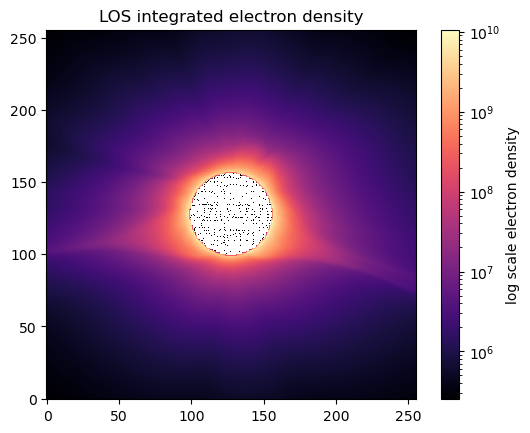

In [10]:
#Integrated_Density_Corrected = np.flip(np.flip(imcombmean,axis=1)) #For some reason I needed to flip it along vertical and horizontal axes to output correctly 
plt.imshow(imcombmean,norm=matplotlib.colors.LogNorm(),cmap='magma',origin='lower')
# plt.xlim(60,190)
# plt.ylim(60,190)
plt.colorbar(label='log scale electron density')
plt.title('LOS integrated electron density')
plt.savefig('/Users/crura/Desktop/Research/Presentations/AGU_21_Pictures/LOS_Integrated_Eclectron_Density.png')
plt.show()

In [85]:
np.savetxt('/Users/crura/Desktop/Research/Magnetic_Field/LOS_Integrated_Elctron_Density.csv',Integrated_Density_Corrected,delimiter=',')

In [11]:
#dfrotdens=pd.read_csv('/Users/crura/Desktop/Research/Magnetic_Field/LOS_Integrated_Elctron_Density.csv', sep=',',header=None)
plt.quiver(dy,dz,arrBy,arrBz)
plt.imshow(imcombmean,norm=matplotlib.colors.LogNorm(),cmap='plasma')
plt.colorbar(label='log scale electron sensity')
plt.title('LOS integrated electron density / POS B Field Vector Plot')
# plt.xlim(80,175)
# plt.ylim(80,175)
plt.xlabel('Y Position')
plt.ylabel('Z Position')
plt.savefig('Electron_Density_B_Field_Vector_Plot_Zoomed.png')
plt.show()

NameError: name 'dy' is not defined

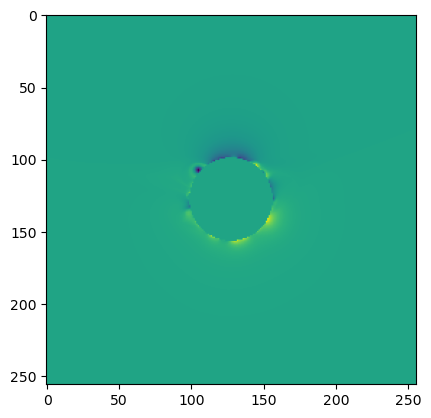

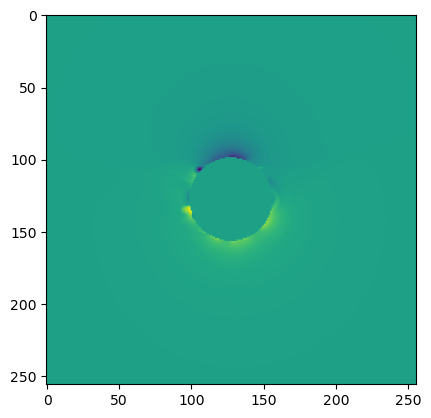

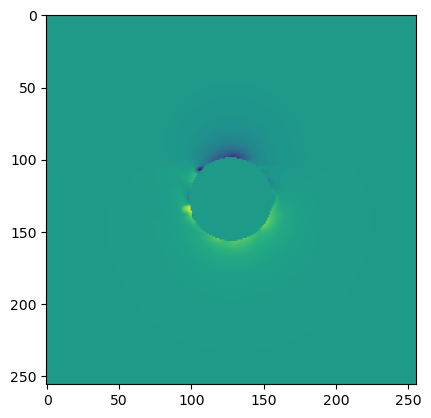

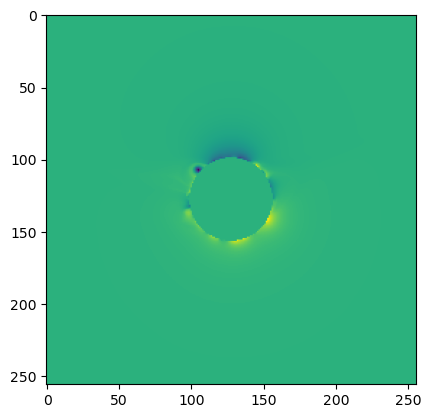

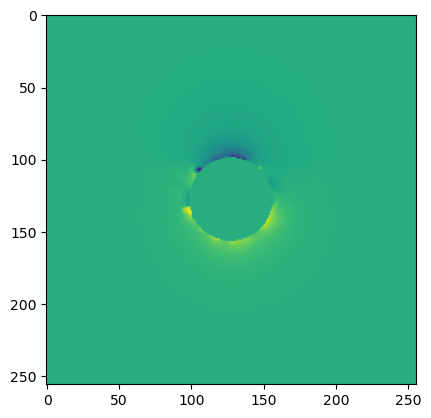

...

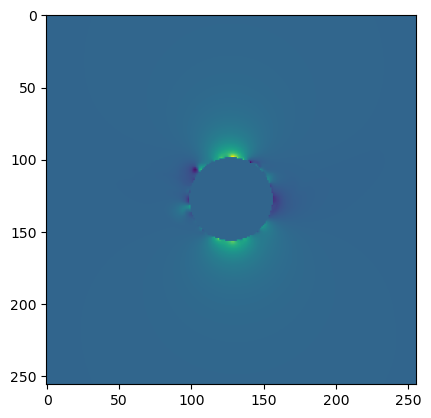

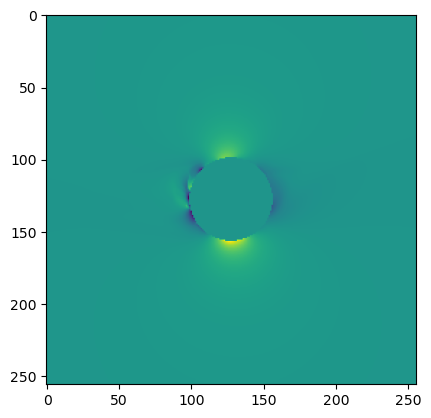

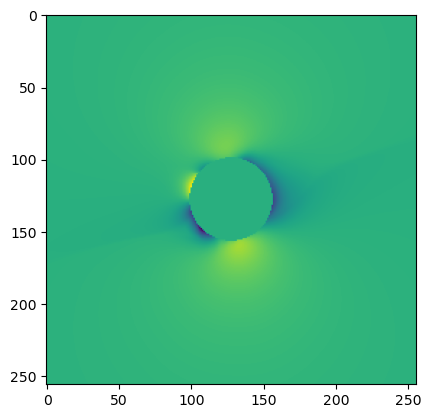

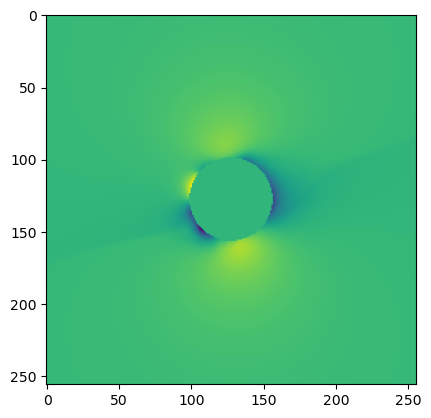

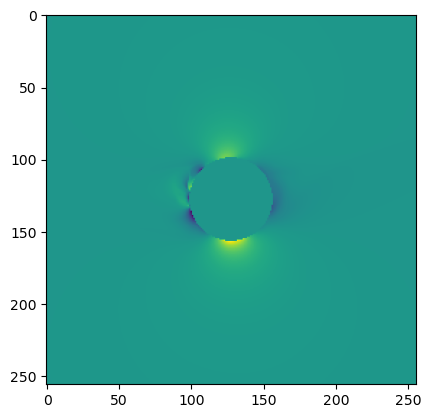

In [13]:
import os
from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np
import scipy as sci
import matplotlib
from tqdm import tqdm_notebook

path = "/Users/crura/Desktop/Research/Magnetic_Field/Bx/"
parent_list = os.listdir("/Users/crura/Desktop/Research/Magnetic_Field/Bx")
Bximagelist = []
headlist = []
for child in parent_list:
    
    
    file = str(path + child)
    df_dens=pd.read_csv(file, sep=',',header=None)
    image_data = df_dens.values
    Bximagelist.append(image_data)
    plt.imshow(image_data)
    plt.show()
    plt.close()

path = "/Users/crura/Desktop/Research/Magnetic_Field/By/"
parent_list = os.listdir("/Users/crura/Desktop/Research/Magnetic_Field/By")
Byimagelist = []
headlist = []
for child in parent_list:
    
    
    file = str(path + child)
    df_dens=pd.read_csv(file, sep=',',header=None)
    image_data = df_dens.values
    Byimagelist.append(image_data)
    plt.imshow(image_data)
    plt.show()
    plt.close()
    
    
    
path = "/Users/crura/Desktop/Research/Magnetic_Field/Bz/"
parent_list = os.listdir("/Users/crura/Desktop/Research/Magnetic_Field/Bz")
Bzimagelist = []
headlist = []
for child in parent_list:
    
    
    file = str(path + child)
    df_dens=pd.read_csv(file, sep=',',header=None)
    image_data = df_dens.values
    Bzimagelist.append(image_data)
    plt.imshow(image_data)
    plt.show()
    plt.close()



In [182]:
imcombmeanBy_Corr = np.flip(np.flip(imcombmeanBy,axis=1))
imcombmeanBz_Corr = np.flip(np.flip(imcombmeanBz,axis=1))

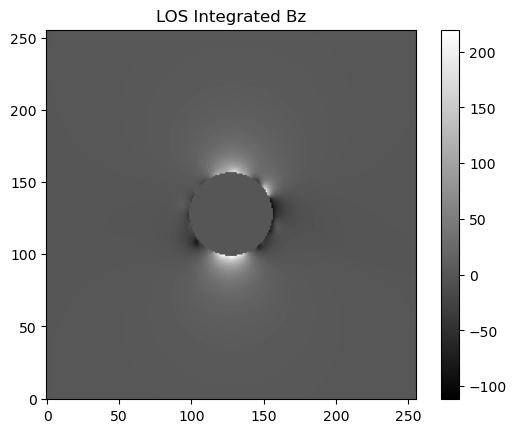

In [14]:
imcombmeanBx = np.sum(Bximagelist, axis=0)
imcombmeanBy = np.sum(Byimagelist, axis=0)
imcombmeanBz = np.sum(Bzimagelist, axis=0)

np.savetxt("Rotated_Integrated_LOS_Bx_Test.csv", imcombmeanBx.ravel(), delimiter=",")
np.savetxt("Rotated_Integrated_LOS_By_Test.csv", imcombmeanBy.ravel(), delimiter=",")
np.savetxt("Rotated_Integrated_LOS_Bz_Test.csv", imcombmeanBz.ravel(), delimiter=",")

plt.imshow(imcombmeanBz,cmap='gist_gray',origin='lower')
plt.colorbar()
plt.title('LOS Integrated Bz')
plt.show()

# LOS Integrated B Field Dataset

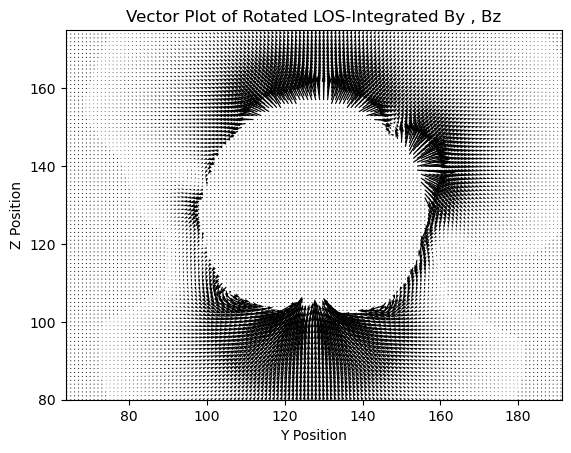

In [15]:
# define n x n grid with spacing dy, dz 
dy = np.linspace(0,255,256)
dz = np.linspace(0,255,256)
# make plot large
mpl.rcParams.update(mpl.rcParamsDefault)
plt.quiver(dy,dz,imcombmeanBy,imcombmeanBz) #Make B_x, B_y the x and y directions of each field vector
# zoom in plot
plt.axis('equal')
plt.xlim(80,175)
plt.ylim(80,175)
# make title
plt.title('Vector Plot of Rotated LOS-Integrated By , Bz')
plt.xlabel('Y Position')
plt.ylabel('Z Position')
plt.savefig('LOS_Integrated_By_Bz_Vector_Plot.png')
# show the plot
plt.show()

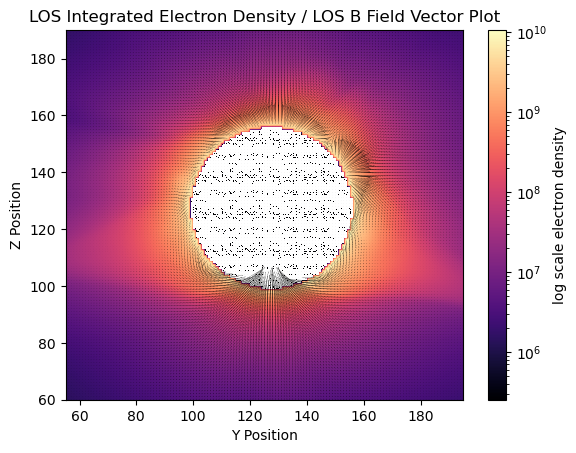

In [73]:
plt.quiver(dy,dz,imcombmeanBy,imcombmeanBz,width=0.00055,color='k')
plt.imshow(imcombmean,norm=matplotlib.colors.LogNorm(),cmap='magma',origin='lower')
plt.axis('equal')
plt.colorbar(label='log scale electron density')
plt.title('LOS Integrated Electron Density / LOS B Field Vector Plot')
plt.xlabel('Y Position')
plt.ylabel('Z Position')
plt.xlim(60,190)
plt.ylim(60,190)
plt.savefig('/Users/crura/Desktop/Research/Presentations/AGU_21_Pictures/LOS_Integrated_Rotated_B_Field_VecPlot_Electron_Density_Overplot.png')
plt.show()

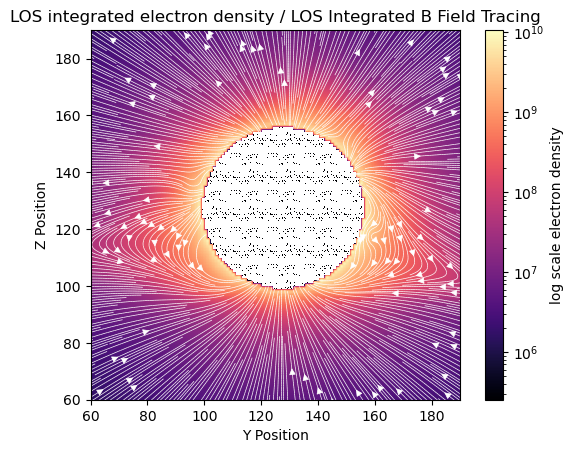

In [18]:
#dfrotdens=pd.read_csv('/Users/crura/Desktop/Research/Magnetic_Field/LOS_Integrated_Elctron_Density.csv', sep=',',header=None)
plt.streamplot(dy,dz,imcombmeanBy,imcombmeanBz,density=10,color='white',linewidth=0.5) # make color of each line represent magnitude of B_x
plt.imshow(imcombmean,norm=matplotlib.colors.LogNorm(),cmap='magma')
plt.colorbar(label='log scale electron density')
plt.title('LOS integrated electron density / LOS Integrated B Field Tracing')
plt.xlim(60,190)
plt.ylim(60,190)
plt.xlabel('Y Position')
plt.ylabel('Z Position')
plt.savefig('/Users/crura/Desktop/Research/Presentations/AGU_21_Pictures/LOS_Integrated_Rotated_B_Field_Tracing_Electron_Density_Overplot.png')
plt.show()

# Single Frame Dataset

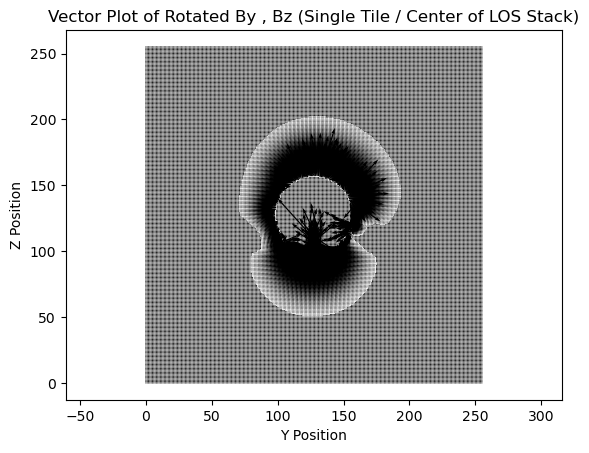

In [8]:
import numpy as np
import scipy as sci 
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
# rotated Bxyz components calculated from FORWARD 
dfBx=pd.read_csv('/Users/crura/rotated_Bx_2dtest.csv', sep=',',header=None)
dfBy=pd.read_csv('/Users/crura/rotated_By_2dtest.csv', sep=',',header=None)
dfBz=pd.read_csv('/Users/crura/rotated_Bz_2dtest.csv', sep=',',header=None)

dfx=pd.read_csv('/Users/crura/rotated_x_2dtest.csv', sep=',',header=None)
dfy=pd.read_csv('/Users/crura/rotated_y_2dtest.csv', sep=',',header=None)
dfz=pd.read_csv('/Users/crura/rotated_z_2dtest.csv', sep=',',header=None)


arrBx = dfBx.values
arrBy = dfBy.values
arrBz = dfBz.values

arrx = dfx.values
arry = dfy.values
arrz = dfz.values

np.savetxt("Rotated_Bx_Test.csv", arrBx.ravel(), delimiter=",")
np.savetxt("Rotated_By_Test.csv", arrBy.ravel(), delimiter=",")
np.savetxt("Rotated_Bz_Test.csv", arrBz.ravel(), delimiter=",")


np.savetxt("Rotated_x_Test.csv", arrx.ravel(), delimiter=",")
np.savetxt("Rotated_y_Test.csv", arry.ravel(), delimiter=",")
np.savetxt("Rotated_z_Test.csv", arrz.ravel(), delimiter=",")



# define n x n grid with spacing dy, dz 
dy = np.linspace(0,255,256)
dz = np.linspace(0,255,256)
# make plot large
mpl.rcParams.update(mpl.rcParamsDefault)
plt.quiver(dy,dz,arrBy,arrBz) #Make B_x, B_y the x and y directions of each field vector
# zoom in plot
plt.axis('equal')
# plt.xlim(80,175)
# plt.ylim(80,175)
# make title
plt.title('Vector Plot of Rotated By , Bz (Single Tile / Center of LOS Stack)')
plt.xlabel('Y Position')
plt.ylabel('Z Position')
plt.savefig('Initital_By_Bz_Vector_Plot.png')
# show the plot
plt.show()

#dfBx

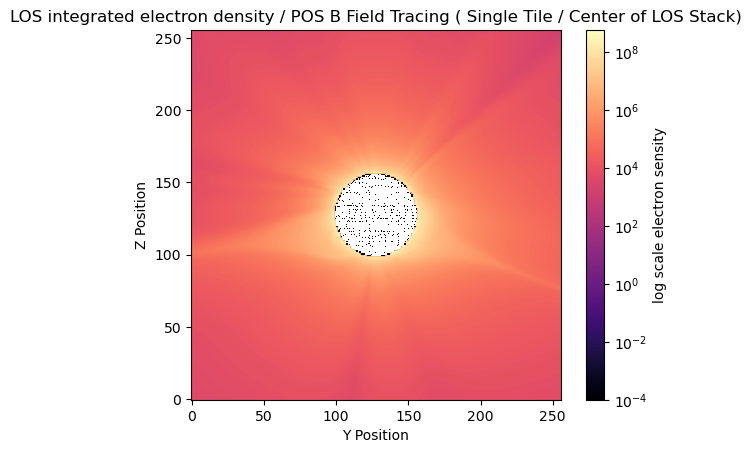

In [64]:
#dfrotdens=pd.read_csv('/Users/crura/Desktop/Research/Magnetic_Field/LOS_Integrated_Elctron_Density.csv', sep=',',header=None)

dfDens_central=pd.read_csv('/Users/crura/rotated_Dens_2dtest.csv', sep=',',header=None)


arrDens_central = dfDens_central.values

ny = np.linspace(0,255,256)
nz = np.linspace(0,255,256)
#plt.streamplot(ny,nz,arrBy,arrBz,density=10,color='white',linewidth=0.5) # make color of each line represent magnitude of B_x
plt.imshow(arrDens_central,norm=matplotlib.colors.LogNorm(),cmap='magma',origin='lower')
plt.colorbar(label='log scale electron sensity')
plt.title('LOS integrated electron density / POS B Field Tracing ( Single Tile / Center of LOS Stack)')
#plt.xlim(60,190)
#plt.ylim(60,190)
plt.xlabel('Y Position')
plt.ylabel('Z Position')
plt.savefig('Rotated_B_Field_Tracing_Electron_Density_Overplot.png')
plt.show()

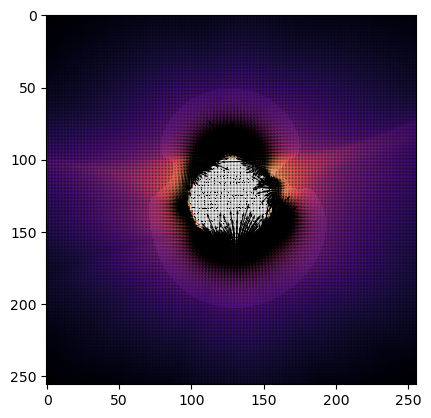

In [202]:
plt.quiver(dy,dz,arrBy,arrBz)
plt.imshow(imcombmean,norm=matplotlib.colors.LogNorm(),cmap='magma')
plt.show()

In [203]:
Integrated_Density_Corrected = np.flip(np.flip(imcombmean.copy(),axis=1))

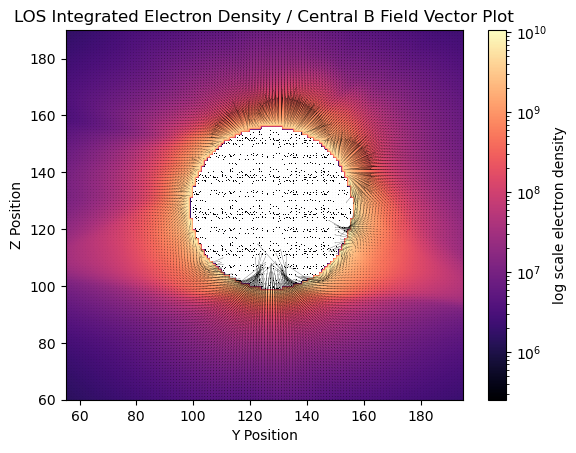

In [77]:
plt.quiver(dy,dz,arrBy,arrBz,width=0.00055,color='k')
plt.imshow(imcombmean,norm=matplotlib.colors.LogNorm(),cmap='magma',origin='lower')
plt.axis('equal')
plt.colorbar(label='log scale electron density')
plt.title('LOS Integrated Electron Density / Central B Field Vector Plot')
plt.xlabel('Y Position')
plt.ylabel('Z Position')
plt.xlim(60,190)
plt.ylim(60,190)
plt.savefig('/Users/crura/Desktop/Research/Presentations/AGU_21_Pictures/Central_Rotated_B_Field_VecPlot_Electron_Density_Overplot.png')
plt.show()

In [212]:
imcombmean.ravel().shape

(65536,)

# Command to generate fordump file with model data

#### for_drive,'PSIMAS',instrument='WL',line='PB',gridtype='PLANEOFSKY',pos=0.0000000,CMER=290.70154,BANG=6.9252958,XXMIN=-4.5000000,XXMAX=4.5000000,YYMIN=-4.5000000,YYMAX=4.5000000,CUBENAME='/Users/crura/Desktop/Research/Magnetic_Field/eclipse2017_mhd_final_copy/2194_WTD_local_cube_MAS.dat',DATE='2017-08-30T02:23:16.968',/verbose

In [1]:
fordump_string = "for_drive,'PSIMAS',instrument='WL',line='PB',gridtype='PLANEOFSKY',pos=0.0000000,CMER=290.70154,BANG=6.9252958,XXMIN=-4.5000000,XXMAX=4.5000000,YYMIN=-4.5000000,YYMAX=4.5000000,CUBENAME='/Users/crura/Desktop/Research/Magnetic_Field/eclipse2017_mhd_final_copy/2194_WTD_local_cube_MAS.dat',DATE='2017-08-30T02:23:16.968',/verbose"

In [2]:
fordump_string

"for_drive,'PSIMAS',instrument='WL',line='PB',gridtype='PLANEOFSKY',pos=0.0000000,CMER=290.70154,BANG=6.9252958,XXMIN=-4.5000000,XXMAX=4.5000000,YYMIN=-4.5000000,YYMAX=4.5000000,CUBENAME='/Users/crura/Desktop/Research/Magnetic_Field/eclipse2017_mhd_final_copy/2194_WTD_local_cube_MAS.dat',DATE='2017-08-30T02:23:16.968',/verbose"

In [5]:
fordump_string.lstrip("for_drive,'PSIMAS',instrument='WL',line='PB',gridtype='PLANEOFSKY',pos=0.0000000,CMER=")

"290.70154,BANG=6.9252958,XXMIN=-4.5000000,XXMAX=4.5000000,YYMIN=-4.5000000,YYMAX=4.5000000,CUBENAME='/Users/crura/Desktop/Research/Magnetic_Field/eclipse2017_mhd_final_copy/2194_WTD_local_cube_MAS.dat',DATE='2017-08-30T02:23:16.968',/verbose"

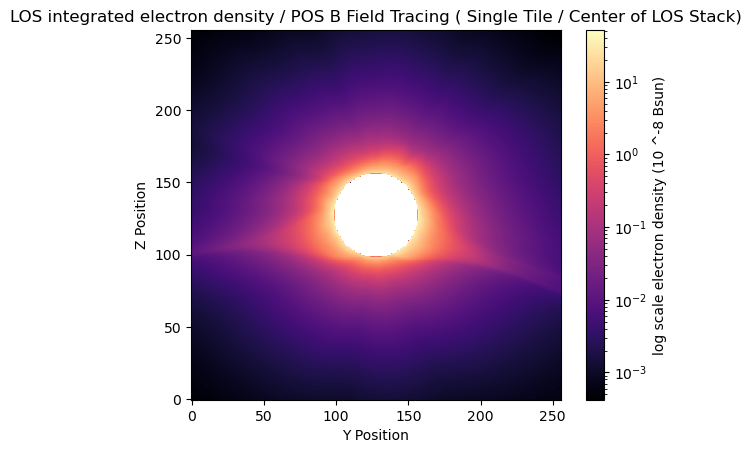

In [12]:
import numpy as np
import scipy as sci 
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib
# rotated Bxyz components calculated from FORWARD 
mpl.rcParams.update(mpl.rcParamsDefault)
dfPB=pd.read_csv('/Users/crura/Desktop/Research/Magnetic_Field/Forward_PB_data.csv', sep=',',header=None)

arrPB = dfPB.values

plt.imshow(arrPB,norm=matplotlib.colors.LogNorm(),cmap='magma',origin='lower')
plt.colorbar(label='log scale electron density (10 ^-8 Bsun)')
plt.title('LOS integrated electron density / POS B Field Tracing ( Single Tile / Center of LOS Stack)')
# plt.xlim(60,190)
# plt.ylim(60,190)
plt.xlabel('Y Position')
plt.ylabel('Z Position')
plt.savefig('Rotated_B_Field_Tracing_Electron_Density_Overplot.png')
plt.show()

# Central Cut of Electron Density Plot

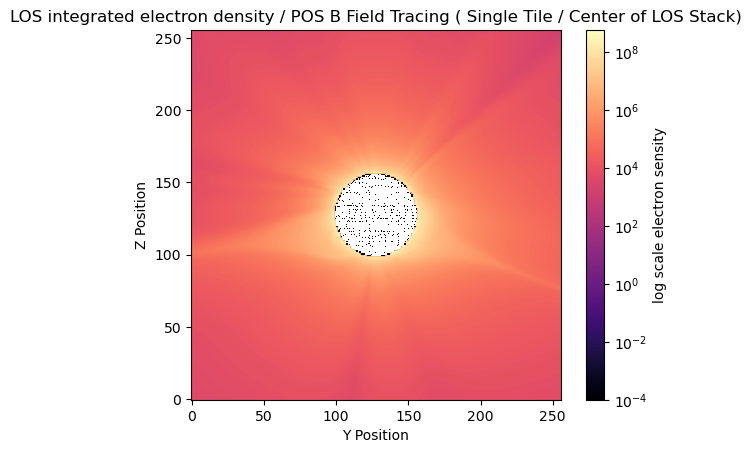

In [67]:
dfDens_central=pd.read_csv('/Users/crura/rotated_Dens_2dtest.csv', sep=',',header=None)


arrDens_central = dfDens_central.values

ny = np.linspace(0,255,256)
nz = np.linspace(0,255,256)
#plt.streamplot(ny,nz,arrBy,arrBz,density=10,color='white',linewidth=0.5) # make color of each line represent magnitude of B_x
plt.imshow(arrDens_central,norm=matplotlib.colors.LogNorm(),cmap='magma',origin='lower')
plt.colorbar(label='log scale electron sensity')
plt.title('LOS integrated electron density / POS B Field Tracing ( Single Tile / Center of LOS Stack)')
#plt.xlim(60,190)
#plt.ylim(60,190)
plt.xlabel('Y Position')
plt.ylabel('Z Position')
plt.savefig('Rotated_B_Field_Tracing_Electron_Density_Overplot.png')
plt.show()

In [4]:
import numpy as np

flattened_x_array = np.linspace(0,250,251)
flattened_y_array = np.linspace(0,250,251)

In [3]:
flattened_x_array.shape

(251,)

Observatory,PSI-MAS Forward Model
Instrument,not specified
Detector,not_specified
Measurement,-1.0
Wavelength,-1.0
Observation Date,2017-08-30 02:23:16
Exposure Time,1.000000 s
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[704.08186191 704.08186191] arcsec / pix
Reference Pixel,[127. 127.] pix

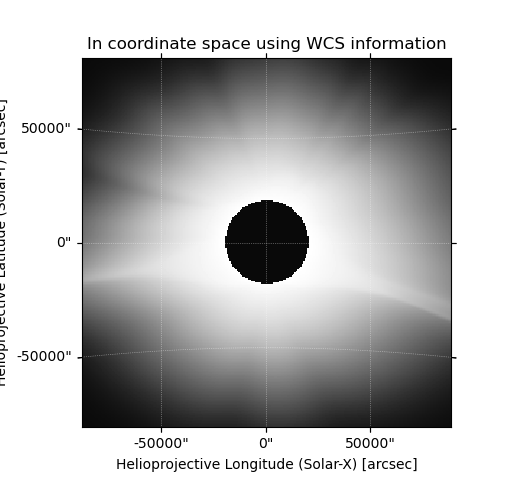
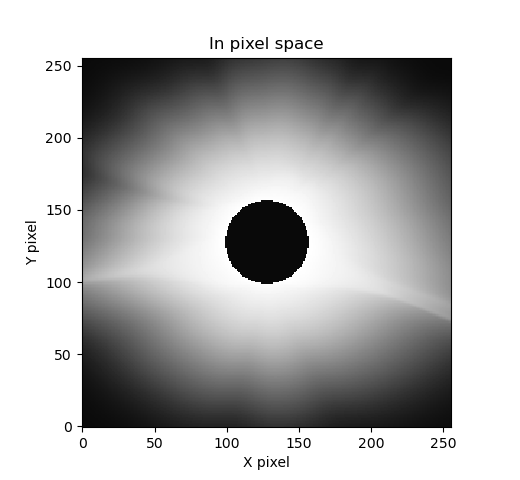
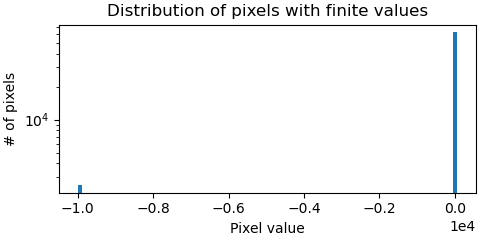

In [12]:
import sunpy.version
import sunpy.map
import matplotlib.pyplot as plt
import matplotlib.colors
# Where is the data located?
fits_dir = '/Users/crura/Desktop/Research/Magnetic_Field/Forward_PB_data.fits'

# Read the image as a Map
psimap = sunpy.map.Map(fits_dir)

# Print the map information (see WCS info/plate scale has been loaded)
psimap

In [5]:
psimap.fits_header

SIMPLE  =                    T / Written by IDL:  Thu Feb 10 13:14:14 2022      
BITPIX  =                  -64 / Real*8 (double precision)                      
NAXIS   =                    2                                                  
NAXIS1  =                  256                                                  
NAXIS2  =                  256                                                  
DATE_OBS= '2017-08-30T02:23:16.968Z'                                            
T_REC   = '2017-08-30T02:23:16.968Z'                                            
T_OBS   = '2017-08-30T02:23:16.968Z'                                            
OBSRVTRY= 'PSI-MAS Forward Model'                                               
INSTRUME= 'not_specified'                                                       
TELESCOP= 'not_specified'                                                       
DETECTOR= 'not_specified'                                                       
IMG_TYPE= 'model   '        

# Central (Not Coaligned) B Field Rotated to MLSO perspective

Observatory,PSI-MAS Forward Model
Instrument,not specified
Detector,not_specified
Measurement,-1.0
Wavelength,-1.0
Observation Date,2017-08-30 02:23:16
Exposure Time,1.0 s
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[45.5348056 45.5348056] arcsec / pix
Reference Pixel,[127. 127.] pix

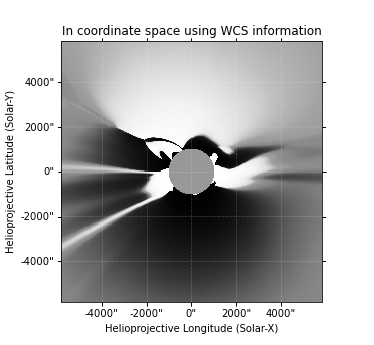
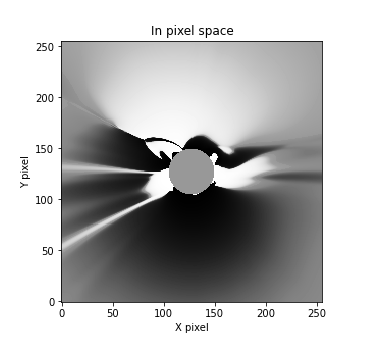
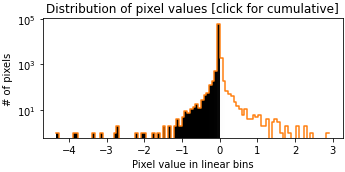
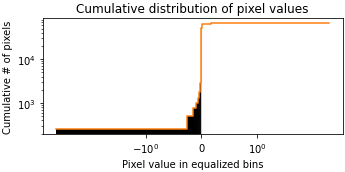

In [1]:
fits_dir_bx = '/Users/crura/Desktop/Research/Magnetic_Field/Forward_Bx_Central_MLSO_Projection.fits'
import sunpy.version
import sunpy.map
import matplotlib.pyplot as plt
import matplotlib.colors

# Read the image as a Map
psimap_bx = sunpy.map.Map(fits_dir_bx)

# Print the map information (see WCS info/plate scale has been loaded)
psimap_bx

Observatory,PSI-MAS Forward Model
Instrument,not specified
Detector,not_specified
Measurement,-1.0
Wavelength,-1.0
Observation Date,2017-08-30 02:23:16
Exposure Time,1.0 s
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[45.5348056 45.5348056] arcsec / pix
Reference Pixel,[127. 127.] pix

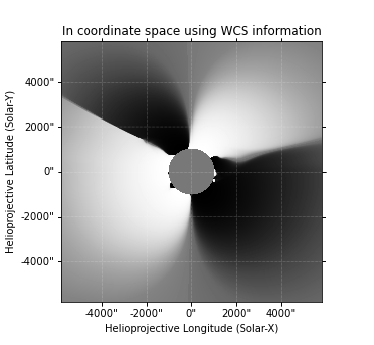
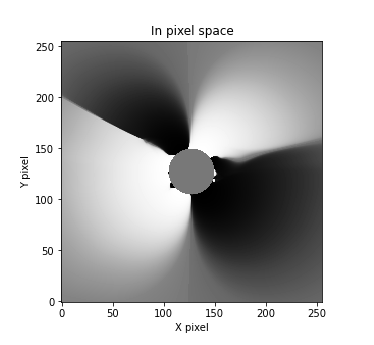
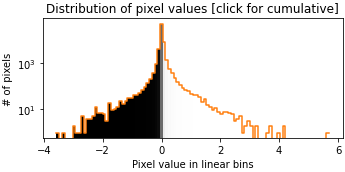
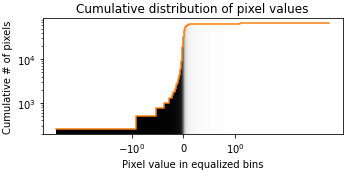

In [2]:
fits_dir_by = '/Users/crura/Desktop/Research/Magnetic_Field/Forward_By_Central_MLSO_Projection.fits'
import sunpy.version
import sunpy.map
import matplotlib.pyplot as plt
import matplotlib.colors

# Read the image as a Map
psimap_by = sunpy.map.Map(fits_dir_by)

# Print the map information (see WCS info/plate scale has been loaded)
psimap_by

Observatory,PSI-MAS Forward Model
Instrument,not specified
Detector,not_specified
Measurement,-1.0
Wavelength,-1.0
Observation Date,2017-08-30 02:23:16
Exposure Time,1.0 s
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[45.5348056 45.5348056] arcsec / pix
Reference Pixel,[127. 127.] pix

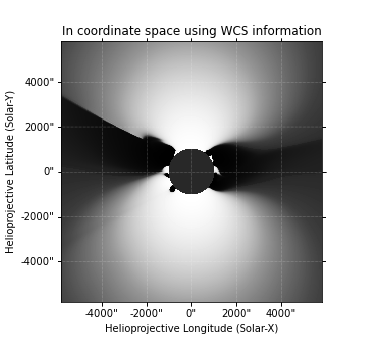
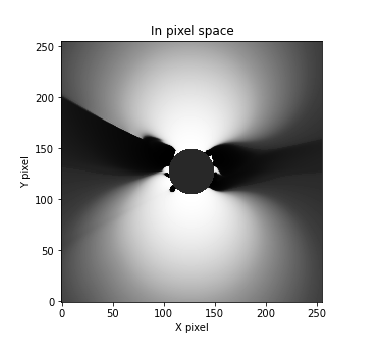
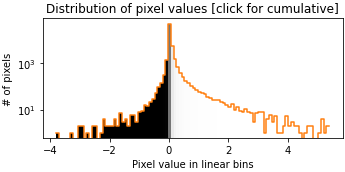
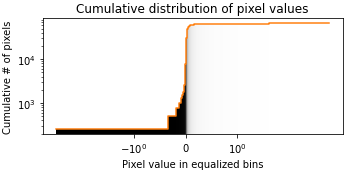

In [3]:
fits_dir_bz = '/Users/crura/Desktop/Research/Magnetic_Field/Forward_Bz_Central_MLSO_Projection.fits'
import sunpy.version
import sunpy.map
import matplotlib.pyplot as plt
import matplotlib.colors

# Read the image as a Map
psimap_bz = sunpy.map.Map(fits_dir_bz)

# Print the map information (see WCS info/plate scale has been loaded)
psimap_bz

# LOS (Not Coaligned) B Field Rotated to MLSO perspective

Observatory,PSI-MAS Forward Model
Instrument,not specified
Detector,not_specified
Measurement,-1.0
Wavelength,-1.0
Observation Date,2017-08-30 02:23:16
Exposure Time,1.0 s
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[45.5348056 45.5348056] arcsec / pix
Reference Pixel,[127. 127.] pix

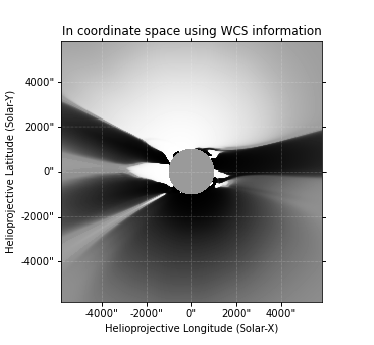
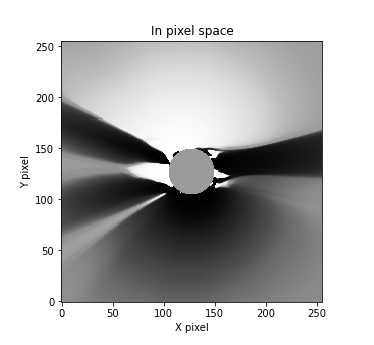
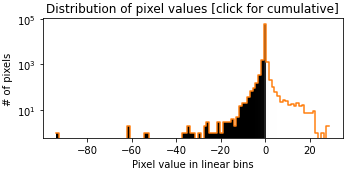
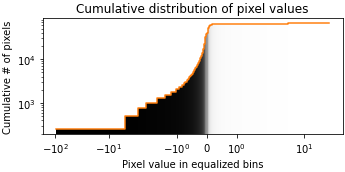

In [4]:
fits_dir_bx_los = '/Users/crura/Desktop/Research/Magnetic_Field/Forward_Bx_LOS_MLSO_Projection.fits'
import sunpy.version
import sunpy.map
import matplotlib.pyplot as plt
import matplotlib.colors

# Read the image as a Map
psimap_bx_los = sunpy.map.Map(fits_dir_bx_los)

# Print the map information (see WCS info/plate scale has been loaded)
psimap_bx_los

Observatory,PSI-MAS Forward Model
Instrument,not specified
Detector,not_specified
Measurement,-1.0
Wavelength,-1.0
Observation Date,2017-08-30 02:23:16
Exposure Time,1.0 s
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[45.5348056 45.5348056] arcsec / pix
Reference Pixel,[127. 127.] pix

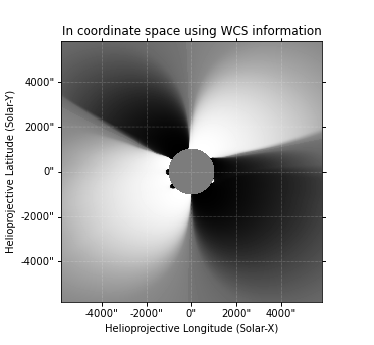
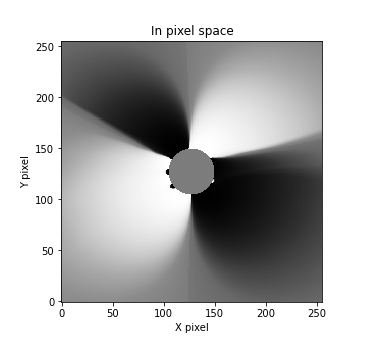
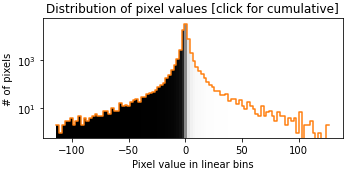
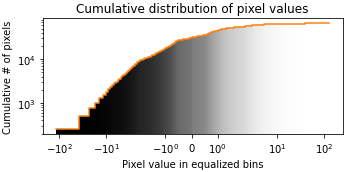

In [5]:
fits_dir_by_los = '/Users/crura/Desktop/Research/Magnetic_Field/Forward_By_LOS_MLSO_Projection.fits'
import sunpy.version
import sunpy.map
import matplotlib.pyplot as plt
import matplotlib.colors

# Read the image as a Map
psimap_by_los = sunpy.map.Map(fits_dir_by_los)

# Print the map information (see WCS info/plate scale has been loaded)
psimap_by_los

Observatory,PSI-MAS Forward Model
Instrument,not specified
Detector,not_specified
Measurement,-1.0
Wavelength,-1.0
Observation Date,2017-08-30 02:23:16
Exposure Time,1.0 s
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[45.5348056 45.5348056] arcsec / pix
Reference Pixel,[127. 127.] pix

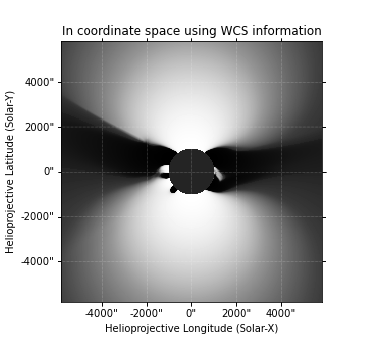
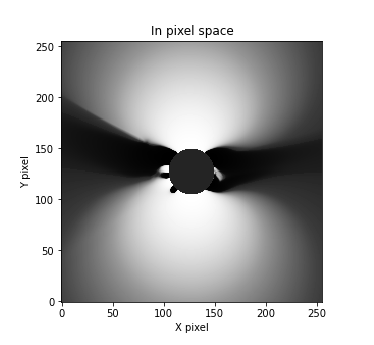
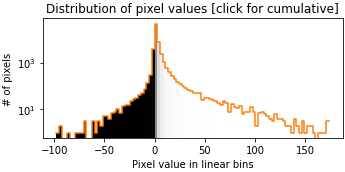
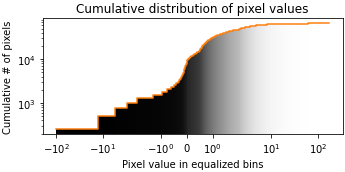

In [6]:
fits_dir_bz_los = '/Users/crura/Desktop/Research/Magnetic_Field/Forward_Bz_LOS_MLSO_Projection.fits'
import sunpy.version
import sunpy.map
import matplotlib.pyplot as plt
import matplotlib.colors

# Read the image as a Map
psimap_bz_los = sunpy.map.Map(fits_dir_bz_los)

# Print the map information (see WCS info/plate scale has been loaded)
psimap_bz_los